In [2]:
%load_ext autoreload
%autoreload 2

import numpy as np 
import numpy.random as random
import scipy
from neuron import Neuron, Log
from simulation import Simulator
from util import get_combinations
from collections import namedtuple
from collections import OrderedDict
from plot import *
import pickle
from tqdm import tqdm
from matplotlib import cm


# pltaspect = (4,3)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Ornstein-Uhlenbeck

Initialise complex model:

In [78]:
neuron_parameters = OrderedDict(
    N = [10],
    S = [5],
    tau_W=[1],
    beta = [1],
    n_C = [2],
    n_g = [1],
    gamma = [1]
)

complex_neuron_for_summary = []
for p in get_combinations(neuron_parameters):
    complex_neuron_for_summary.append(Neuron(p.N, p.S, p.tau_W, p.beta, gamma=p.gamma, n_C=p.n_C, n_g=p.n_g))

Initialise simple models:

In [20]:
simple_neuron_parameters = OrderedDict(
    N = [10],
    S = [1],
    # tau_W=[0.63, 3.27, 14.54, 61.17, 295.59],
    # tau_W= [  0.43580738,   1.97280049,   8.02023061,  32.1402713 ,
    #     152.62443861],
    # tau_W=[0.63],
    tau_W = [ 0.65486921,  2.31590864,  6.78519102, 19.00408772, 56.05794404],
    beta = [0],
    n_C = [2]
)

simple_neurons_for_summary = []
for p in get_combinations(simple_neuron_parameters):
    simple_neurons_for_summary.append(Neuron(p.N, p.S, p.tau_W, p.beta, p.n_C))

In [21]:
with open('../data/test.pkl', 'wb+') as f:
    pickle.dump(simple_neurons_for_summary, f)

### O-U for u, y and z:

In [22]:
env_parameters_ou = OrderedDict(
    # sigma_s = [0.1],
    sigma_s = [1],
    epsilon = [0.02, 0.05, 0.1, 0.2, 0.5, 1, 2],
    # epsilon = [0.1, 1],
    sigma_y = [1],
    # sigma_y = [0],
    tau_y = [0.1, 0.2, 0.5, 1, 2, 5, 10, 20],
    # tau_y = [0.1, 20],
    tau_u = [0.1],
    tau_z = [40],
    sigma_z = [1]
)

envs_for_summary_ou = []
for p in get_combinations(env_parameters_ou):
    envs_for_summary_ou.append(Simulator(p.sigma_s, p.epsilon, p.sigma_y, p.tau_y, tau_u=p.tau_u, tau_z=p.tau_z, sigma_z=p.sigma_z, mode='ou', z='ou', dt=0.002))

In [20]:
trials_complex_summary_ou = OrderedDict(
    neuron = complex_neuron_for_summary,
    env = envs_for_summary_ou
)

T = 1000

# run all the combinations available
for trial in tqdm(get_combinations(trials_complex_summary_ou)):
    trial.env.run(trial.neuron, T=T, summary=False, cutoff=-0.6)

100%|██████████| 4/4 [03:12<00:00, 48.01s/it]


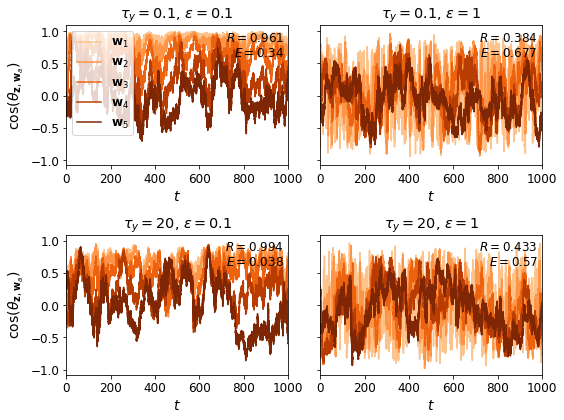

In [21]:
fig11 = plot_wz_align(complex_neuron_for_summary[0])

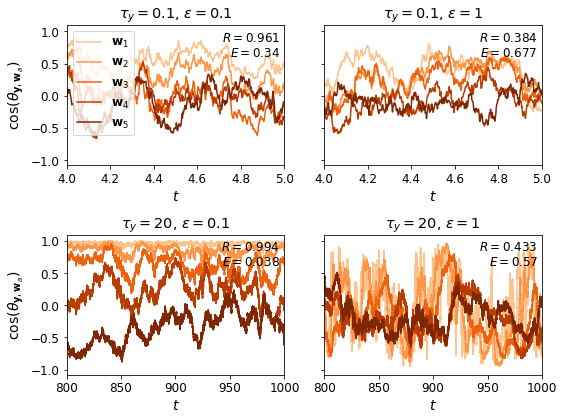

In [23]:
fig12 = plot_wy_align(complex_neuron_for_summary[0], blocks=(40,50))

### O-U for both u and y:

In [79]:
env_parameters_ou = OrderedDict(
    # sigma_s = [0.1],
    sigma_s = [1],
    epsilon = [0.02, 0.05, 0.1, 0.2, 0.5, 1, 2],
    # epsilon = [0.1, 2],
    sigma_y = [1],
    # sigma_y = [0],
    tau_y = [0.1, 0.2, 0.5, 1, 2, 5, 10, 20],
    # tau_y = [0.1, 20],
    tau_u = [0.1]
)

envs_for_summary_ou = []
for p in get_combinations(env_parameters_ou):
    envs_for_summary_ou.append(Simulator(p.sigma_s, p.epsilon, p.sigma_y, p.tau_y, tau_u=p.tau_u, mode='ou', dt=0.002))

Run simluation with complex model:

In [80]:
trials_complex_summary_ou = OrderedDict(
    neuron = complex_neuron_for_summary,
    env = envs_for_summary_ou
)

T = 1000

# run all the combinations available
for trial in tqdm(get_combinations(trials_complex_summary_ou)):
    trial.env.run(trial.neuron, T=T, summary=True, cutoff=-0.6)

100%|██████████| 56/56 [42:41<00:00, 45.75s/it]


Run simluation with simple models:

In [24]:
trials_simple_summary_ou = OrderedDict(
    neuron = simple_neurons_for_summary,
    env = envs_for_summary_ou
)

T = 1000

# run all the combinations available
for trial in tqdm(get_combinations(trials_simple_summary_ou)):
    trial.env.run(trial.neuron, T=T, summary=True, cutoff=-0.6)

100%|██████████| 280/280 [3:25:02<00:00, 43.94s/it]


In [61]:
complex_neuron_for_summary

[Properties: {'N': 10, 'S': 5, 'tau_W': 1, 'beta': 1, 'gamma': 1.0, 'n_C': 2, 'n_g': 2, 'alpha': 1}.
 Trials: 
 0: {'sigma_s': 1, 'epsilon': 0.1, 'sigma_y': 1, 'tau_u': 0.1, 'tau_y': 0.1, 'tau_z': None, 'mode': 'ou', 'T': 1000, 'dt': 0.002}. 
 1: {'sigma_s': 1, 'epsilon': 0.1, 'sigma_y': 1, 'tau_u': 0.1, 'tau_y': 20, 'tau_z': None, 'mode': 'ou', 'T': 1000, 'dt': 0.002}. 
 2: {'sigma_s': 1, 'epsilon': 2, 'sigma_y': 1, 'tau_u': 0.1, 'tau_y': 0.1, 'tau_z': None, 'mode': 'ou', 'T': 1000, 'dt': 0.002}. 
 3: {'sigma_s': 1, 'epsilon': 2, 'sigma_y': 1, 'tau_u': 0.1, 'tau_y': 20, 'tau_z': None, 'mode': 'ou', 'T': 1000, 'dt': 0.002}. ]

Theoretical fixed point solution and stability.

From Yashar's work:
`W_ast` is the theoretical fixed point solution.
Stability conditions are 
$$-\chi < \dfrac{2}{3} \lambda_1,$$
$$-\chi < \lambda_1 - \lambda_i \ \ \ \ \ (i>1).$$

In [112]:
log = complex_neuron_for_summary[0].logs[3]
# log = simple_neurons_for_summary[0].logs[0]
# print(log.W[:, [0], :].shape)
# print(log.z.shape)
# print((np.transpose(log.z, (0,2,1)) @ log.z / np.sqrt(np.transpose(log.y, (0,2,1)) @ log.y)).squeeze().shape)
# print(np.mean(np.abs((np.transpose(log.y, (0,2,1)) @ log.z / np.sqrt(np.transpose(log.y, (0,2,1)) @ log.y))).squeeze()))
# print(np.mean(np.abs((np.transpose(log.u, (0,2,1)) @ log.z / np.sqrt(np.transpose(log.u, (0,2,1)) @ log.u))).squeeze()))
# print(np.mean(log.y, axis=0).squeeze())
# print(np.mean(np.sqrt(np.transpose(log.u, (0,2,1)) @ log.u), axis=0).squeeze())
# print(log.W[:, [0], :])
y = log.y[-1]
z = log.z[-1]
P = complex_neuron_for_summary[0].P
C = log.env_parameters['sigma_s'] ** 2 * (y @ y.T) + log.env_parameters['epsilon'] ** 2 * np.eye(complex_neuron_for_summary[0].N)
C
print(np.linalg.eigvals(C))
lambda1 = np.max(np.linalg.eigvals(C))
lambda1
L = complex_neuron_for_summary[0].L
L_inv = np.linalg.inv(L)
print(L_inv)
chi = 1 / (L_inv[0, 0])
chi
k1 = np.sqrt((1/complex_neuron_for_summary[0].alpha) * (1 + chi/lambda1))
k1
W_ast = k1 * chi * (L_inv @ complex_neuron_for_summary[0].e1 @ y.T)
W_ast
print('chi = {}'.format(chi))
W = log.W[-1]

for i in range(5):
    print(W[i, :] @ y / (np.sqrt(W[i, :].T @ W[i, :]) * np.sqrt(y.T @ y)))
for i in range(5):
    print(W[i, :] @ z / np.sqrt(W[i, :].T @ W[i, :]))

# print(L @ W + P @ W @ C - complex_neuron_for_summary[0].alpha * np.trace(P @ W @ C @ W.T) * (P @ W))
# print(L @ W_ast + P @ W_ast @ C - complex_neuron_for_summary[0].alpha * np.trace(P @ W_ast @ C @ W_ast.T) * (P @ W_ast))

[5. 4. 4. 4. 4. 4. 4. 4. 4. 4.]
[[-1.36472347e+00 -7.29446936e-01 -1.88340807e-01 -2.39162930e-02
  -1.49476831e-03]
 [-7.29446936e-01 -1.45889387e+00 -3.76681614e-01 -4.78325859e-02
  -2.98953662e-03]
 [-3.76681614e-01 -7.53363229e-01 -2.26008969e+00 -2.86995516e-01
  -1.79372197e-02]
 [-1.91330344e-01 -3.82660688e-01 -1.14798206e+00 -4.20926756e+00
  -2.63079223e-01]
 [-9.56651719e-02 -1.91330344e-01 -5.73991031e-01 -2.10463378e+00
  -8.13153961e+00]]
chi = -0.732749178532311
[[0.44982053]]
[[-0.06637887]]
[[-0.6636209]]
[[-0.57669743]]
[[0.21754042]]
[0.36501397]
[-0.46362402]
[-0.39931773]
[-0.39393557]
[-0.14459135]


### Results

In [81]:
# with open('../data/complex_ou9.pkl', 'wb+') as f:
#     pickle.dump(complex_neuron_for_summary, f)

In [25]:
# with open('../data/simple_ou5.pkl', 'wb+') as f:
#     pickle.dump(simple_neurons_for_summary, f)

In [77]:
# with open('../data/complex_ou_example9.pkl', 'wb+') as f:
#     pickle.dump(complex_neuron_for_summary, f)

1. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1$. (THESE ARE DEFAULT VALUES).

2. $\sigma_s = \sigma_y = \beta = 1$, $ \tau_w = 0.2$, $\tau_u =0.1$, $n=2$.

3. $\sigma_s = \sigma_y = \tau_w = 1$, $\beta = 2$, $\tau_u =0.1$, $n=2$.

4. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n=2$, $\gamma=1.5$.

5. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n_C=2$, $n_g=1.5$.

6. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n_C=2$, $n_g=1.2$.

7. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1.1$.

8. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n_C=n_g=2$, $\gamma=1.2$.

9. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n_C=2$, $n_g=1$.

LOAD:

In [111]:
with open('../data/complex_ou_example9.pkl', 'rb') as f:
    complex_neuron_for_summary = pickle.load(f)

In [115]:
with open('../data/complex_ou9.pkl', 'rb') as f:
    complex_neuron_for_summary = pickle.load(f)
with open('../data/simple_ou1.pkl', 'rb') as f:
    simple_neurons_for_summary = pickle.load(f)

In [65]:
complex_neuron_for_summary[0]

Properties: {'N': 10, 'S': 5, 'tau_W': 1, 'beta': 1, 'gamma': 1.5, 'n': 2, 'alpha': 1}.
Trials: 
0: {'sigma_s': 1, 'epsilon': 0.1, 'sigma_y': 1, 'tau_u': 0.1, 'tau_y': 0.1, 'tau_z': None, 'mode': 'ou', 'T': 1000, 'dt': 0.002}. 
1: {'sigma_s': 1, 'epsilon': 0.1, 'sigma_y': 1, 'tau_u': 0.1, 'tau_y': 10, 'tau_z': None, 'mode': 'ou', 'T': 1000, 'dt': 0.002}. 
2: {'sigma_s': 1, 'epsilon': 0.1, 'sigma_y': 1, 'tau_u': 0.1, 'tau_y': 20, 'tau_z': None, 'mode': 'ou', 'T': 1000, 'dt': 0.002}. 
3: {'sigma_s': 1, 'epsilon': 1, 'sigma_y': 1, 'tau_u': 0.1, 'tau_y': 0.1, 'tau_z': None, 'mode': 'ou', 'T': 1000, 'dt': 0.002}. 
4: {'sigma_s': 1, 'epsilon': 1, 'sigma_y': 1, 'tau_u': 0.1, 'tau_y': 10, 'tau_z': None, 'mode': 'ou', 'T': 1000, 'dt': 0.002}. 
5: {'sigma_s': 1, 'epsilon': 1, 'sigma_y': 1, 'tau_u': 0.1, 'tau_y': 20, 'tau_z': None, 'mode': 'ou', 'T': 1000, 'dt': 0.002}. 
6: {'sigma_s': 1, 'epsilon': 2, 'sigma_y': 1, 'tau_u': 0.1, 'tau_y': 0.1, 'tau_z': None, 'mode': 'ou', 'T': 1000, 'dt': 0.002}.

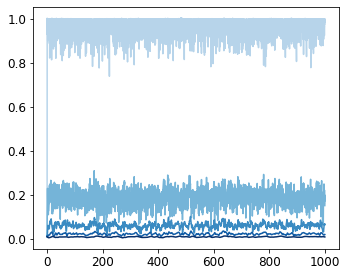

In [113]:
log = complex_neuron_for_summary[0].logs[3]

fig8, axs8 = plt.subplots(figsize=(5,4))

cm_section = np.linspace(0.3, 1, 5)
oranges = [ cm.Oranges(x) for x in cm_section ]
blues = [ cm.Blues(x) for x in cm_section ]


for k in range(5):
    # axs8.plot(
    #     log.timeline, 
    #     (log.W[:, [k], :] @ log.y).squeeze(),
    #     color = oranges[k],
    #     # label = '$\mathbf{{w}}_{{{k}}}$'.format(k=k+1)
    # )

    axs8.plot(
        log.timeline, 
        (np.sqrt(log.W[:, [k], :] @ np.transpose(log.W[:, [k], :], (0,2,1)))).squeeze(), 
        color = blues[k],
        # label = '$\mathbf{{w}}_{{{k}}}$'.format(k=k+1)
    )

log.W[-10:,[2],:]

fig8.tight_layout()

In [114]:
fig8.savefig('figures/log/norm_n_g=1.pdf', bbox_inches='tight')

In [39]:
complex_neuron_for_summary[0].timescales_whole(log=complex_neuron_for_summary[0].logs[3])

array([[ 0.10797491,  1.27229169,  3.50273111,  8.18927244, 19.25151348],
       [ 0.63836319,  1.75969297,  3.79729212,  8.25238601, 19.25736918],
       [ 0.63836319,  1.75969297,  3.79729212,  8.25238601, 19.25736918],
       [ 0.63836319,  1.75969297,  3.79729212,  8.25238601, 19.25736918],
       [ 0.63836319,  1.75969297,  3.79729212,  8.25238601, 19.25736918],
       [ 0.63836319,  1.75969297,  3.79729212,  8.25238601, 19.25736918],
       [ 0.63836319,  1.75969297,  3.79729212,  8.25238601, 19.25736918],
       [ 0.63836319,  1.75969297,  3.79729212,  8.25238601, 19.25736918],
       [ 0.63836319,  1.75969297,  3.79729212,  8.25238601, 19.25736918],
       [ 0.63836319,  1.75969297,  3.79729212,  8.25238601, 19.25736918]])

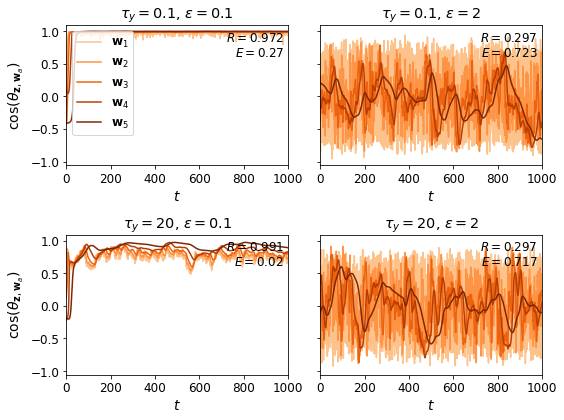

In [104]:
fig11 = plot_wz_align(complex_neuron_for_summary[0])

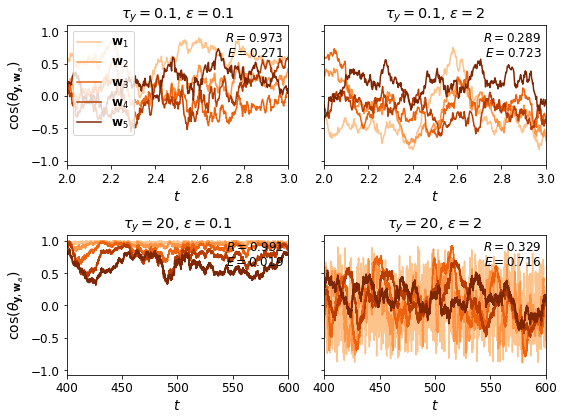

In [73]:
fig12 = plot_wy_align(complex_neuron_for_summary[0], blocks=(20,30))

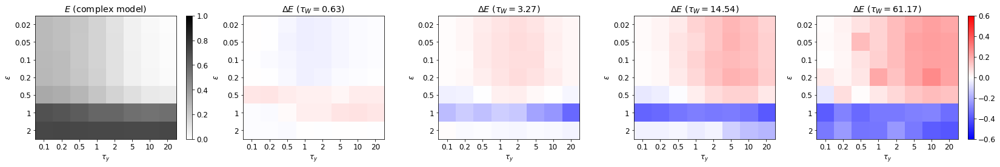

In [116]:
fig7, axs7 = plt.subplots(1, 5, figsize=(23,4))
ims = []

ims.append(plot_cm_E_abs(fig7, axs7[0], complex_neuron_for_summary[0]))

for j, neuron in enumerate(simple_neurons_for_summary[:4]):

    ims.append(plot_cm_E_diff(fig7, axs7[j+1], complex_neuron_for_summary[0], simple_neurons_for_summary[j]))

fig7.colorbar(ims[0], ax=axs7[0])
fig7.colorbar(ims[-1], ax=axs7[-1])
fig7.tight_layout()

In [117]:
fig7.savefig('figures/log/colormap_n_g=1.pdf', bbox_inches='tight')

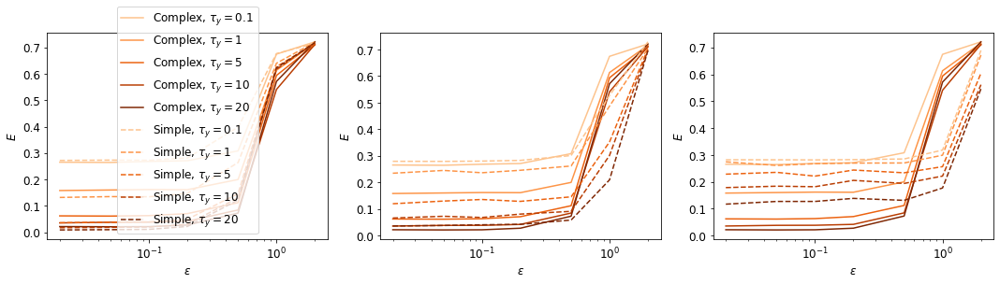

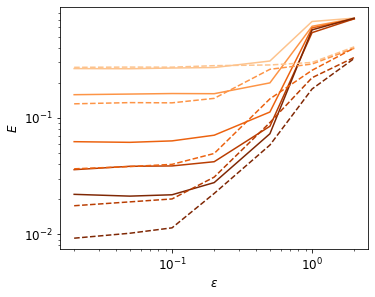

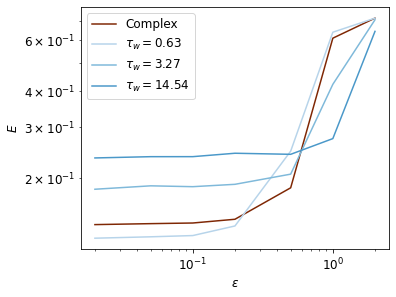

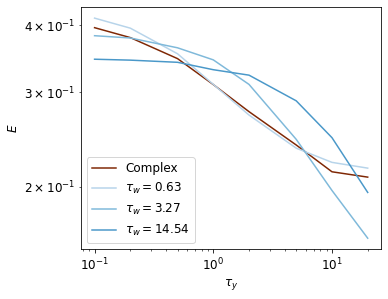

In [5]:
cm_section = np.linspace(0.3, 1, 5)
blues1 = [ cm.Blues(x) for x in cm_section ]
oranges1 = [ cm.Oranges(x) for x in cm_section ]

fig6, axs6 = plt.subplots(1, 3, figsize=(15,4))

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
        plot_E(fig6, axs6[j], complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

    for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
        plot_E(fig6, axs6[j], neuron, 'epsilon', color=oranges1[i], label='Simple, $\\tau_y={}$'.format(tau_y), style='--', tau_y=tau_y)

    axs6[j].set_xscale('log')
    axs6[j].set_yscale('linear')

    axs6[j].set_xlabel('$\epsilon$')
    axs6[j].set_ylabel('$E$')

axs6[0].legend()

''''''''''''

fig66, axs66 = plt.subplots(figsize=(5,4))

for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
    plot_E(fig66, axs66, complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
    plot_E_best(fig66, axs66, simple_neurons_for_summary, 'epsilon', color=oranges1[i], label='Simple, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

axs66.set_xscale('log')
axs66.set_yscale('log')

axs66.set_xlabel('$\epsilon$')
axs66.set_ylabel('$E$')

# axs66.legend()

''''''''''''
cm_section = np.linspace(0.3, 0.9, len(simple_neurons_for_summary))
blues3 = [ cm.Blues(x) for x in cm_section ]
oranges3 = [ cm.Oranges(x) for x in cm_section ]

fig666, axs666 = plt.subplots(figsize=(5,4))
plot_E_average(fig666, axs666, complex_neuron_for_summary[0], 'epsilon', color=oranges1[-1], label='Complex')

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    plot_E_average(fig666, axs666, neuron, 'epsilon', color=blues3[j])

axs666.set_xscale('log')
axs666.set_yscale('log')

axs666.set_xlabel('$\epsilon$')
axs666.set_ylabel('$E$')

axs666.legend()

''''''''''''

cm_section = np.linspace(0.3, 0.9, len(simple_neurons_for_summary))
blues3 = [ cm.Blues(x) for x in cm_section ]
oranges3 = [ cm.Oranges(x) for x in cm_section ]

fig6666, axs6666 = plt.subplots(figsize=(5,4))
plot_E_average(fig6666, axs6666, complex_neuron_for_summary[0], 'tau_y', color=oranges1[-1], label='Complex')

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    plot_E_average(fig6666, axs6666, neuron, 'tau_y', color=blues3[j])

axs6666.set_xscale('log')
axs6666.set_yscale('log')

axs6666.set_xlabel('$\\tau_y$')
axs6666.set_ylabel('$E$')

axs6666.legend()

In [68]:
fig6.tight_layout()
fig66.tight_layout()
fig666.tight_layout()
fig6666.tight_layout()
fig6.savefig('figures/full_ou_1_individual.pdf', bbox_inches='tight')
fig66.savefig('figures/full_ou_1_best.pdf', bbox_inches='tight')
fig666.savefig('figures/full_ou_1_epsilon_averaged.pdf', bbox_inches='tight')
fig6666.savefig('figures/full_ou_1_tau_y_averaged.pdf', bbox_inches='tight')

### O-U for $\boldsymbol{u}$, block update for $\boldsymbol{y}$:

In [38]:
env_parameters_ou = OrderedDict(
    # sigma_s = [0.1],
    sigma_s = [1],
    epsilon = [0.02, 0.05, 0.1, 0.2, 0.5, 1, 2],
    # epsilon = [0.1, 1],
    sigma_y = [1],
    # sigma_y = [0],
    tau_y = [0.1, 0.2, 0.5, 1, 2, 5, 10, 20],
    # tau_y = [0.1, 20],
    tau_u = [0.1]
)

envs_for_summary_ou = []
for p in get_combinations(env_parameters_ou):
    envs_for_summary_ou.append(Simulator(p.sigma_s, p.epsilon, p.sigma_y, p.tau_y, tau_u=p.tau_u, mode='ou_u', dt=0.002))

Run simluation with complex model:

In [39]:
trials_complex_summary_ou = OrderedDict(
    neuron = complex_neuron_for_summary,
    env = envs_for_summary_ou
)

T = 1000

# run all the combinations available
for trial in tqdm(get_combinations(trials_complex_summary_ou)):
    trial.env.run(trial.neuron, T=T, summary=True, cutoff=-0.6)

100%|██████████| 56/56 [29:22<00:00, 31.48s/it]


Run simluation with simple models:

In [40]:
trials_simple_summary_ou = OrderedDict(
    neuron = simple_neurons_for_summary,
    env = envs_for_summary_ou
)

T = 1000

# run all the combinations available
for trial in tqdm(get_combinations(trials_simple_summary_ou)):
    trial.env.run(trial.neuron, T=T, summary=True, cutoff=-0.6)

100%|██████████| 280/280 [2:15:00<00:00, 28.93s/it]


### Results

1. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n=2$.

In [41]:
# with open('../data/complex_ou_u1.pkl', 'wb+') as f:
#     pickle.dump(complex_neuron_for_summary, f)

In [42]:
# with open('../data/simple_ou_u1.pkl', 'wb+') as f:
#     pickle.dump(simple_neurons_for_summary, f)

In [27]:
# with open('../data/complex_ou_u_example1.pkl', 'wb+') as f:
#     pickle.dump(complex_neuron_for_summary, f)

In [69]:
with open('../data/complex_ou_u1.pkl', 'rb') as f:
    complex_neuron_for_summary = pickle.load(f)
with open('../data/simple_ou_u1.pkl', 'rb') as f:
    simple_neurons_for_summary = pickle.load(f)

1.:

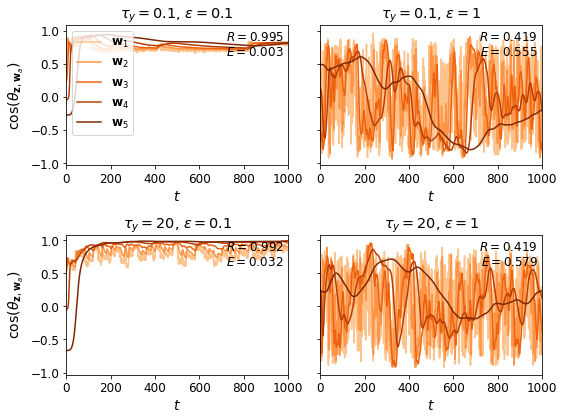

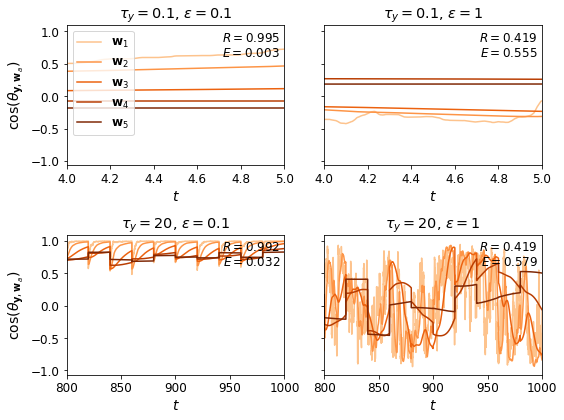

In [26]:
fig11 = plot_wz_align(complex_neuron_for_summary[0])
fig12 = plot_wy_align(complex_neuron_for_summary[0], blocks=(40,50))

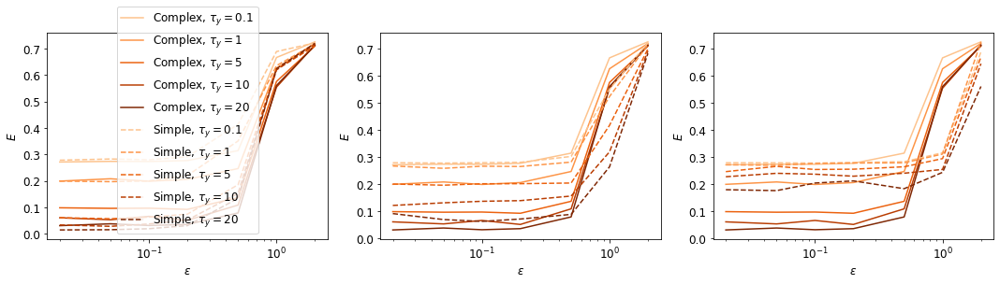

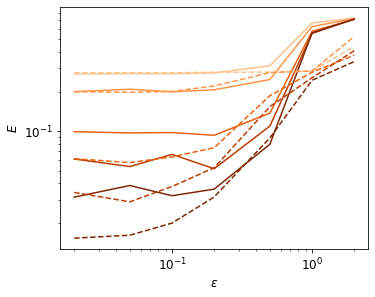

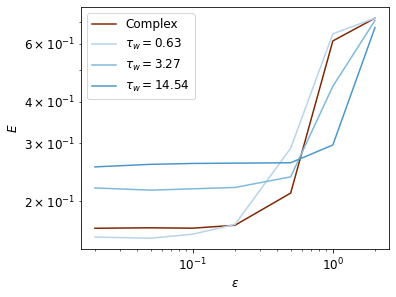

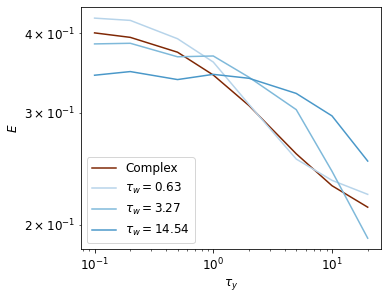

In [43]:
cm_section = np.linspace(0.3, 1, 5)
blues1 = [ cm.Blues(x) for x in cm_section ]
oranges1 = [ cm.Oranges(x) for x in cm_section ]

fig6, axs6 = plt.subplots(1, 3, figsize=(15,4))

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
        plot_E(fig6, axs6[j], complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

    for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
        plot_E(fig6, axs6[j], neuron, 'epsilon', color=oranges1[i], label='Simple, $\\tau_y={}$'.format(tau_y), style='--', tau_y=tau_y)

    axs6[j].set_xscale('log')
    axs6[j].set_yscale('linear')

    axs6[j].set_xlabel('$\epsilon$')
    axs6[j].set_ylabel('$E$')

axs6[0].legend()

''''''''''''

fig66, axs66 = plt.subplots(figsize=(5,4))

for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
    plot_E(fig66, axs66, complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
    plot_E_best(fig66, axs66, simple_neurons_for_summary, 'epsilon', color=oranges1[i], label='Simple, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

axs66.set_xscale('log')
axs66.set_yscale('log')

axs66.set_xlabel('$\epsilon$')
axs66.set_ylabel('$E$')

# axs66.legend()

''''''''''''
cm_section = np.linspace(0.3, 0.9, len(simple_neurons_for_summary))
blues3 = [ cm.Blues(x) for x in cm_section ]
oranges3 = [ cm.Oranges(x) for x in cm_section ]

fig666, axs666 = plt.subplots(figsize=(5,4))
plot_E_average(fig666, axs666, complex_neuron_for_summary[0], 'epsilon', color=oranges1[-1], label='Complex')

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    plot_E_average(fig666, axs666, neuron, 'epsilon', color=blues3[j])

axs666.set_xscale('log')
axs666.set_yscale('log')

axs666.set_xlabel('$\epsilon$')
axs666.set_ylabel('$E$')

axs666.legend()

''''''''''''

cm_section = np.linspace(0.3, 0.9, len(simple_neurons_for_summary))
blues3 = [ cm.Blues(x) for x in cm_section ]
oranges3 = [ cm.Oranges(x) for x in cm_section ]

fig6666, axs6666 = plt.subplots(figsize=(5,4))
plot_E_average(fig6666, axs6666, complex_neuron_for_summary[0], 'tau_y', color=oranges1[-1], label='Complex')

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    plot_E_average(fig6666, axs6666, neuron, 'tau_y', color=blues3[j])

axs6666.set_xscale('log')
axs6666.set_yscale('log')

axs6666.set_xlabel('$\\tau_y$')
axs6666.set_ylabel('$E$')

axs6666.legend()

In [44]:
fig6.tight_layout()
fig66.tight_layout()
fig666.tight_layout()
fig6666.tight_layout()
fig6.savefig('figures/semi_ou_1_individual.pdf', bbox_inches='tight')
fig66.savefig('figures/semi_ou_1_best.pdf', bbox_inches='tight')
fig666.savefig('figures/semi_ou_1_epsilon_averaged.pdf', bbox_inches='tight')
fig6666.savefig('figures/semi_ou_1_tau_y_averaged.pdf', bbox_inches='tight')

### Smoothed block change:
(discontinued)

In [38]:
env_parameters_ou = OrderedDict(
    sigma_s = [1],
    epsilon = [0.02, 0.1, 0.4, 1.6],
    # epsilon = [0.1, 0.4],
    sigma_y = [1],
    tau_y = [10, 50, 100, 200],
    # tau_y = [50, 100],
    tau_u = [2]
)

envs_for_summary_ou = []
for p in get_combinations(env_parameters_ou):
    envs_for_summary_ou.append(Simulator(p.sigma_s, p.epsilon, p.sigma_y, p.tau_y, tau_u=p.tau_u, mode='ou', dt=0.01))

In [39]:
neuron_parameters = OrderedDict(
    N = [10],
    S = [5],
    tau_W=[1],
    beta = [1],
    n = [2]
)

complex_neuron_for_summary = []
for p in get_combinations(neuron_parameters):
    complex_neuron_for_summary.append(Neuron(p.N, p.S, p.tau_W, p.beta, p.n))

In [40]:
simple_neuron_parameters = OrderedDict(
    N = [10],
    S = [1],
    tau_W=[0.63, 3.27, 14.54, 61.17, 295.59],
    beta = [0],
    n = [2]
)

simple_neurons_for_summary = []
for p in get_combinations(simple_neuron_parameters):
    simple_neurons_for_summary.append(Neuron(p.N, p.S, p.tau_W, p.beta, p.n))

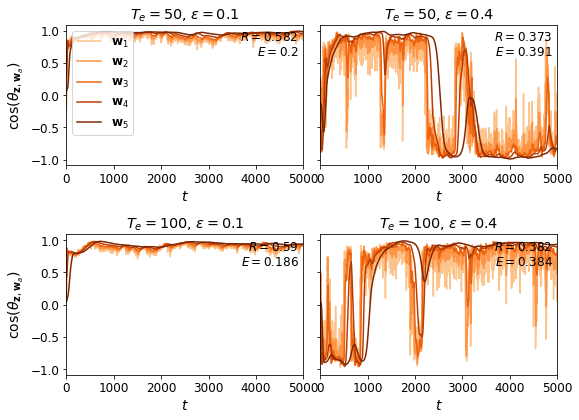

In [36]:
fig21 = plot_wz_align(complex_neuron_for_summary[0])

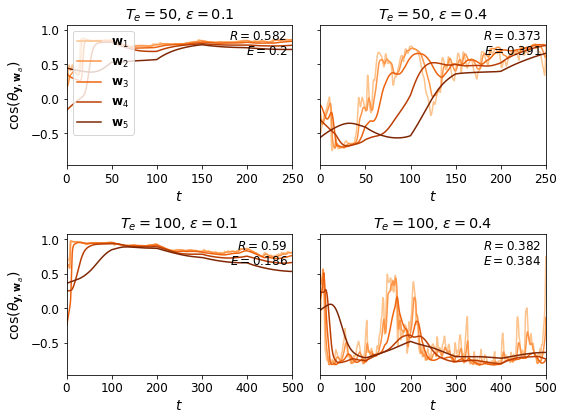

In [37]:
fig22 = plot_wy_align(complex_neuron_for_summary[0], blocks=(0, 5))

In [41]:
trials_complex_summary_ou = OrderedDict(
    neuron = complex_neuron_for_summary,
    env = envs_for_summary_ou
)

T = 5000

# run all the combinations available
for trial in tqdm(get_combinations(trials_complex_summary_ou)):
    trial.env.run(trial.neuron, T=T, summary=True, cutoff=-0.7)

100%|██████████| 16/16 [09:10<00:00, 34.43s/it]


In [42]:
trials_simple_summary_ou = OrderedDict(
    neuron = simple_neurons_for_summary,
    env = envs_for_summary_ou
)

T = 5000

# run all the combinations available
for trial in tqdm(get_combinations(trials_simple_summary_ou)):
    trial.env.run(trial.neuron, T=T, summary=True, cutoff=-0.7)

100%|██████████| 80/80 [41:30<00:00, 31.14s/it]


These are the "smoothed block change" results:

In [44]:
# with open('../data/complex_ou2.pkl', 'wb+') as f:
#     pickle.dump(complex_neuron_for_summary, f)

In [45]:
# with open('../data/simple_ou2.pkl', 'wb+') as f:
#     pickle.dump(simple_neurons_for_summary, f)

In [38]:
# with open('../data/complex_ou2.pkl', 'rb') as f:
#     complex_neuron_for_summary = pickle.load(f)

In [39]:
# with open('../data/simple_ou2.pkl', 'rb') as f:
#     simple_neurons_for_summary = pickle.load(f)

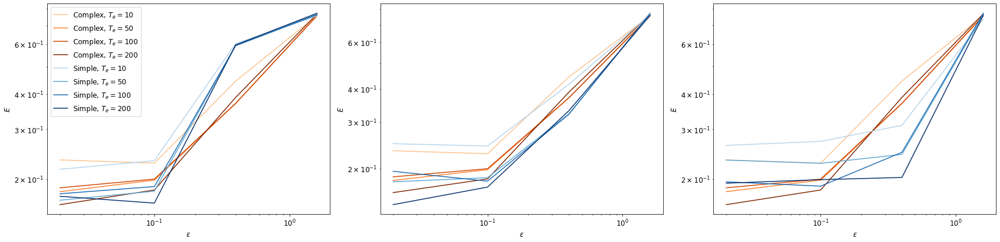

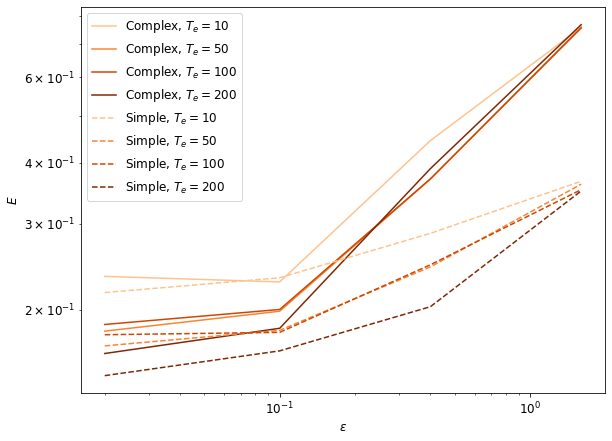

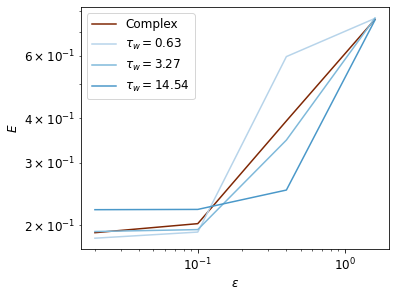

In [43]:
cm_section = np.linspace(0.3, 1, 4)
blues1 = [ cm.Blues(x) for x in cm_section ]
oranges1 = [ cm.Oranges(x) for x in cm_section ]

fig6, axs6 = plt.subplots(1, 3, figsize=(24,6))

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    for i, tau_y in enumerate([10, 50, 100, 200]):
        plot_E(fig6, axs6[j], complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

    for i, tau_y in enumerate([10, 50, 100, 200]):
        plot_E(fig6, axs6[j], neuron, 'epsilon', color=blues1[i], label='Simple, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

    axs6[j].set_xscale('log')
    axs6[j].set_yscale('log')

    axs6[j].set_xlabel('$\epsilon$')
    axs6[j].set_ylabel('$E$')

axs6[0].legend()

''''''''''''

fig66, axs66 = plt.subplots(figsize=(8,6))

for i, tau_y in enumerate([10, 50, 100, 200]):
    plot_E(fig66, axs66, complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

for i, tau_y in enumerate([10, 50, 100, 200]):
    plot_E_best(fig66, axs66, simple_neurons_for_summary, 'epsilon', color=oranges1[i], label='Simple, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

axs66.set_xscale('log')
axs66.set_yscale('log')

axs66.set_xlabel('$\epsilon$')
axs66.set_ylabel('$E$')

axs66.legend()

''''''''''''
cm_section = np.linspace(0.3, 0.9, len(simple_neurons_for_summary))
blues3 = [ cm.Blues(x) for x in cm_section ]
oranges3 = [ cm.Oranges(x) for x in cm_section ]

fig666, axs666 = plt.subplots(figsize=(5,4))
plot_E_average(fig666, axs666, complex_neuron_for_summary[0], 'epsilon', color=oranges1[-1], label='Complex')

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    plot_E_average(fig666, axs666, neuron, 'epsilon', color=blues3[j])

axs666.set_xscale('log')
axs666.set_yscale('log')

axs666.set_xlabel('$\epsilon$')
axs666.set_ylabel('$E$')

axs666.legend()

# Blocks, with $\tau_u$ added
(discontinued for now)

In [54]:
env_parameters_block = OrderedDict(
    # sigma_s = [0.1],
    sigma_s = [1],
    # epsilon = [0.02, 0.05, 0.1, 0.2, 0.5, 1, 2],
    epsilon = [0.1, 1],
    sigma_y = [1],
    # sigma_y = [0],
    # tau_y = [0.1, 0.2, 0.5, 1, 2, 5, 10, 20],
    tau_y = [0.1, 20],
    tau_u = [0.1]
)

envs_for_summary_block = []
for p in get_combinations(env_parameters_block):
    envs_for_summary_block.append(Simulator(p.sigma_s, p.epsilon, p.sigma_y, p.tau_y, tau_u=p.tau_u, mode='block', dt=0.002))

In [56]:
trials_complex_summary_block = OrderedDict(
    neuron = complex_neuron_for_summary,
    env = envs_for_summary_block
)

T = 1000

# run all the combinations available
for trial in tqdm(get_combinations(trials_complex_summary_block)):
    trial.env.run(trial.neuron, T=T, summary=True, cutoff=-0.6)

100%|██████████| 4/4 [01:38<00:00, 24.56s/it]


In [49]:
trials_simple_summary_block = OrderedDict(
    neuron = simple_neurons_for_summary,
    env = envs_for_summary_block
)

T = 1000

# run all the combinations available
for trial in tqdm(get_combinations(trials_simple_summary_block)):
    trial.env.run(trial.neuron, T=T, summary=True, cutoff=-0.6)

100%|██████████| 280/280 [1:30:25<00:00, 19.38s/it]


1. $\sigma_s = \sigma_y = \tau_w = \beta = 1$, $\tau_u =0.1$, $n=2$.

In [50]:
# with open('../data/complex_block1.pkl', 'wb+') as f:
#     pickle.dump(complex_neuron_for_summary, f)

In [51]:
# with open('../data/simple_block1.pkl', 'wb+') as f:
#     pickle.dump(simple_neurons_for_summary, f)

In [58]:
# with open('../data/complex_block_example1.pkl', 'wb+') as f:
#     pickle.dump(complex_neuron_for_summary, f)

In [2]:
with open('../data/complex_block1.pkl', 'rb') as f:
    complex_neuron_for_summary = pickle.load(f)
with open('../data/simple_block1.pkl', 'rb') as f:
    simple_neurons_for_summary = pickle.load(f)

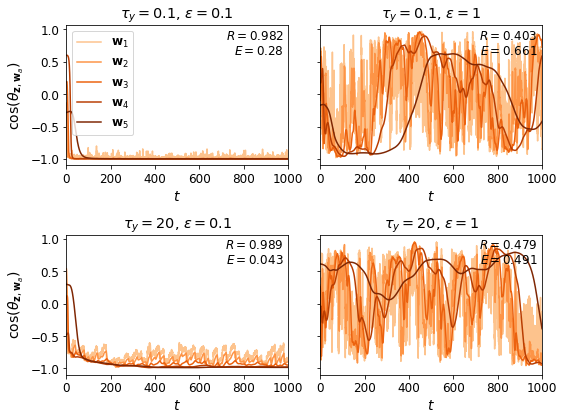

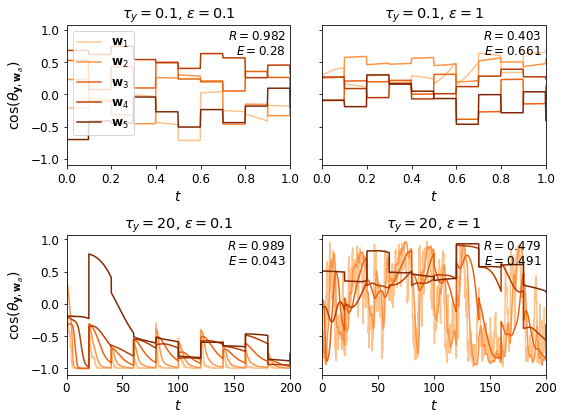

In [57]:
fig21 = plot_wz_align(complex_neuron_for_summary[0])
fig22 = plot_wy_align(complex_neuron_for_summary[0], blocks=(0, 10))

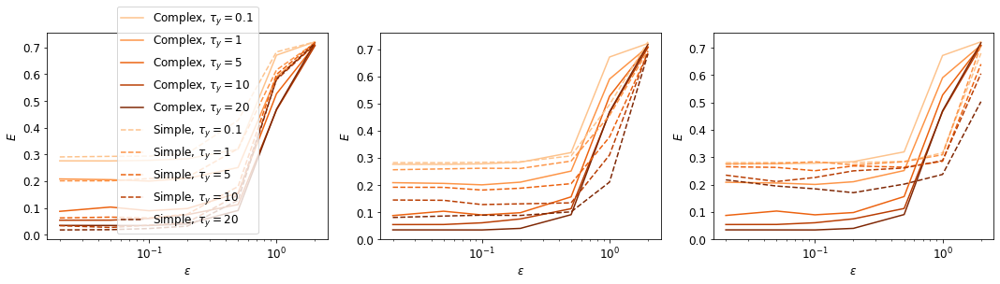

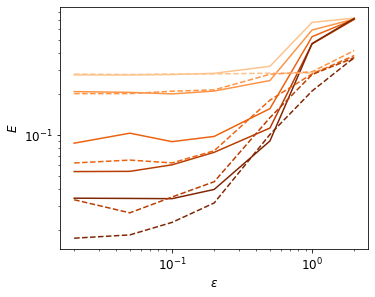

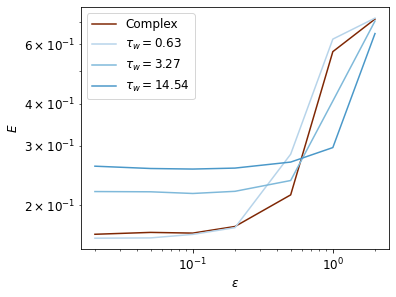

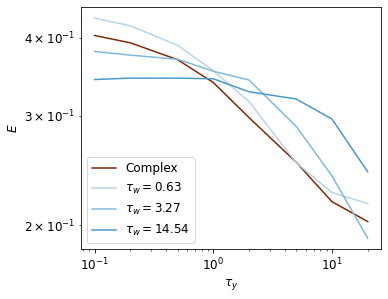

In [3]:
cm_section = np.linspace(0.3, 1, 5)
blues1 = [ cm.Blues(x) for x in cm_section ]
oranges1 = [ cm.Oranges(x) for x in cm_section ]

fig6, axs6 = plt.subplots(1, 3, figsize=(15,4))

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
        plot_E(fig6, axs6[j], complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

    for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
        plot_E(fig6, axs6[j], neuron, 'epsilon', color=oranges1[i], label='Simple, $\\tau_y={}$'.format(tau_y), style='--', tau_y=tau_y)

    axs6[j].set_xscale('log')
    axs6[j].set_yscale('linear')

    axs6[j].set_xlabel('$\epsilon$')
    axs6[j].set_ylabel('$E$')

axs6[0].legend()

''''''''''''

fig66, axs66 = plt.subplots(figsize=(5,4))

for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
    plot_E(fig66, axs66, complex_neuron_for_summary[0], 'epsilon', color=oranges1[i], label='Complex, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

for i, tau_y in enumerate( [0.1, 1, 5, 10, 20]):
    plot_E_best(fig66, axs66, simple_neurons_for_summary, 'epsilon', color=oranges1[i], label='Simple, $\\tau_y={}$'.format(tau_y), tau_y=tau_y)

axs66.set_xscale('log')
axs66.set_yscale('log')

axs66.set_xlabel('$\epsilon$')
axs66.set_ylabel('$E$')

# axs66.legend()

''''''''''''
cm_section = np.linspace(0.3, 0.9, len(simple_neurons_for_summary))
blues3 = [ cm.Blues(x) for x in cm_section ]
oranges3 = [ cm.Oranges(x) for x in cm_section ]

fig666, axs666 = plt.subplots(figsize=(5,4))
plot_E_average(fig666, axs666, complex_neuron_for_summary[0], 'epsilon', color=oranges1[-1], label='Complex')

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    plot_E_average(fig666, axs666, neuron, 'epsilon', color=blues3[j])

axs666.set_xscale('log')
axs666.set_yscale('log')

axs666.set_xlabel('$\epsilon$')
axs666.set_ylabel('$E$')

axs666.legend()

''''''''''''

cm_section = np.linspace(0.3, 0.9, len(simple_neurons_for_summary))
blues3 = [ cm.Blues(x) for x in cm_section ]
oranges3 = [ cm.Oranges(x) for x in cm_section ]

fig6666, axs6666 = plt.subplots(figsize=(5,4))
plot_E_average(fig6666, axs6666, complex_neuron_for_summary[0], 'tau_y', color=oranges1[-1], label='Complex')

for j, neuron in enumerate(simple_neurons_for_summary[:3]):

    plot_E_average(fig6666, axs6666, neuron, 'tau_y', color=blues3[j])

axs6666.set_xscale('log')
axs6666.set_yscale('log')

axs6666.set_xlabel('$\\tau_y$')
axs6666.set_ylabel('$E$')

axs6666.legend()

In [4]:
fig6.tight_layout()
fig66.tight_layout()
fig666.tight_layout()
fig6666.tight_layout()
fig6.savefig('figures/block_1_individual.pdf', bbox_inches='tight')
fig66.savefig('figures/block_1_best.pdf', bbox_inches='tight')
fig666.savefig('figures/block_1_epsilon_averaged.pdf', bbox_inches='tight')
fig6666.savefig('figures/block_1_tau_y_averaged.pdf', bbox_inches='tight')